## MODELO DE BLASIUS

Modelo para un fluido en contacto con una placa plana, considero ecuación de la energía.

-  Ecuaciones del problema (suponiendo propiedades del fluido constantes):

1. $\partial_x u_x + \partial_y u_y = 0$
2. $\rho (u_x \partial_x u_x + u_y \partial_y u_x) = \mu (\partial_y^2 u_x)$
3. $\rho (u_x \partial_x h + u_y \partial_y h) = \frac{\mu}{Pr} \partial_y^2 h + \mu (\partial_y u)^2 $

- Condiciones de contorno:

$ \vec{v}|_{y=0}=0, h = h(x)$
$ u|_{y \rightarrow \infty, x=0}=u_\infty, h|_{y \rightarrow \infty, x=0} = h_\infty $

# Adimensionalización

1. $\partial_\eta u_\eta + \Lambda \partial_\sigma u_\sigma = 0$
2. $u_\eta \partial_\eta u_\eta + \Lambda u_\sigma \partial_\sigma u_\eta = \frac{\Lambda^2}{Re} \partial_\sigma^2 u_\eta$
3. $u_\eta \partial_\eta \theta + \Lambda u_\sigma \partial_\sigma \theta = \frac{\Lambda^2}{Re} \left( \frac{1}{Pr} \partial_\sigma^2 \theta + \frac{1}{\beta} (\partial_\sigma u_\eta)^2 \right) $

- Condiciones de contorno:

$ (u_\eta,\;u_\sigma)|_{\sigma=0}=0, \; \theta = \theta(\eta)$
$ u_\eta|_{\sigma = 1, \;\eta=0}=1, \; \theta|_{\sigma = 1, \eta=0} = 0 $

# Parámetros adimensionales

$ \eta = \frac{x}{L} $
$ \sigma = \frac{y}{H} $
$ \theta = \frac{h - h_{ref}}{h_{max} - h_{ref}} $
$ u_\eta = \frac{u_x}{u_\infty} $
$ u_\sigma = \frac{u_y}{u_\infty} $
$ \Lambda = \frac{L}{H} $
$ Re = \frac{\rho u_\infty L}{\mu} $
$ \beta = \frac{h_{max} - h_{ref}}{u_\infty^2} $



**Explicación detallada de la resolución del problema en el código:**

---

### **1. Formulación del problema físico**
El problema consiste en analizar una capa límite laminar sobre una placa plana, considerando tanto la transferencia de momento como de calor. Las ecuaciones originales son:

1. **Conservación de masa**:
   $ \partial_x u_x + \partial_y u_y = 0 $

2. **Conservación de momento**:
   $ \rho (u_x \partial_x u_x + u_y \partial_y u_x) = \mu \partial_y^2 u_x $

3. **Conservación de energía**:
   $ \rho (u_x \partial_x h + u_y \partial_y h) = \frac{\mu}{Pr} \partial_y^2 h + \mu (\partial_y u)^2 $

**Condiciones de contorno**:
- En la pared ($y=0$): $u_x = u_y = 0$, $h = h(x)$.
- En el flujo libre ($y \to \infty$): $u_x = u_\infty$, $h = h_\infty$.

---

### **2. Adimensionalización de las ecuaciones**
Para simplificar el análisis, se introducen variables adimensionales:

- **Coordenadas espaciales**:
  $ \eta = \frac{x}{L}, \quad \sigma = \frac{y}{H}, \quad \Lambda = \frac{L}{H} $

- **Velocidades**:
  $ u_\eta = \frac{u_x}{u_\infty}, \quad u_\sigma = \frac{u_y}{u_\infty} $

- **Entalpía adimensional**:
  $ \theta = \frac{h - h_{\text{ref}}}{h_{\text{max}} - h_{\text{ref}}} $

- **Parámetros adimensionales**:
  $ Re = \frac{\rho u_\infty L}{\mu}, \quad Pr = \frac{\mu c_p}{k}, \quad \beta = \frac{h_{\text{max}} - h_{\text{ref}}}{u_\infty^2} $

Tras la adimensionalización, las ecuaciones se reducen a un sistema de EDOs en función de $\eta$ y $\sigma$.

---

### **3. Método de similitud de Blasius**
Se asume que los perfiles de velocidad y temperatura pueden expresarse en términos de una variable de similitud $\eta$, combinando las coordenadas $x$ e $y$:
$ \eta = y \sqrt{\frac{u_\infty}{\nu x}}, $
donde $\nu = \mu/\rho$ es la viscosidad cinemática.

#### **Transformación clave**:
- Se introduce la **función de corriente** $f(\eta)$:
  $ u_x = u_\infty f'(\eta), \quad u_y = \frac{1}{2} \sqrt{\frac{\nu u_\infty}{x}} (\eta f' - f). $

- La ecuación de momento se reduce a:
  $ f''' + \frac{1}{2} f f'' = 0, $
  con condiciones:
  $ f(0) = 0, \quad f'(0) = 0, \quad f'(\infty) = 1. $

---

### **4. Implementación numérica en Python**

#### **a. Definición de parámetros físicos**
Se definen propiedades del fluido (aire en este caso):
```python
rho = 1.225      # Densidad [kg/m³]
mu = 1.7894e-5   # Viscosidad dinámica [Pa·s]
k = 0.0257       # Conductividad térmica [W/m·K]
cp = 1006        # Calor específico [J/kg·K]
u_inf = 100      # Velocidad del flujo libre [m/s]
L = 1            # Longitud de la placa [m]
```

#### **b. Cálculo de parámetros adimensionales**
- **Número de Reynolds**:
  $ Re = \frac{\rho u_\infty L}{\mu} $
- **Número de Prandtl**:
  $ Pr = \frac{\mu c_p}{k} $
- **Beta ($\beta$)**:
  $ \beta = \frac{(h_{\text{max}} - h_{\text{inf}})}{u_\infty^2} $

#### **c. Sistema de ecuaciones diferenciales**
Se implementan las ecuaciones de Blasius y energía en forma adimensional:
```python
def blasius_system(eta, y):
    f, f_p, f_pp, theta, theta_p = y
    df_deta = f_p
    dfp_deta = f_pp
    dfpp_deta = -0.5 * f * f_pp  # Ecuación de Blasius
    dtheta_deta = theta_p
    dtheta_p_deta = -Pr * f * theta_p + beta * (f_pp**2)  # Ecuación de energía
    return [df_deta, dfp_deta, dfpp_deta, dtheta_deta, dtheta_p_deta]
```

#### **d. Condiciones iniciales**
Para resolver el sistema, se necesitan valores iniciales para $f$, $f'$, $f''$, $\theta$, y $\theta'$:
- **En la pared ($\eta=0$)**:
  $ f(0) = 0, \quad f'(0) = 0, \quad \theta(0) = 1. $
- **Valor inicial de $f''(0)$**: 
  Se estima como $0.33206$, solución clásica de Blasius.

```python
def initial_conditions():
    return [0.0, 0.0, 0.33206, 1.0, 0.0]
```

#### **e. Método numérico: `solve_ivp`**
Se utiliza el método Runge-Kutta de orden 4-5 (`RK45`) para resolver el sistema de EDOs:
```python
sol = solve_ivp(blasius_system, (0, 1), initial_conditions(), t_eval=np.linspace(0, 1, 500))
```

#### **f. Cálculo de $f''(0)$**
Para obtener el valor exacto de $f''(0)$, se resuelve la ecuación de Blasius básica en un dominio extendido ($\eta \in$):
```python
def calculate_fpp_0():
    # Sistema reducido solo para Blasius
    def blasius_basic(eta, y):
        f, f_p, f_pp = y
        return [f_p, f_pp, -0.5 * f * f_pp]
    
    # Condiciones iniciales estimadas
    sol = solve_ivp(blasius_basic, (0, 10), [0, 0, 1], t_eval=[10])
    return sol.y[2][0]  # f''(0)
```

---

### **5. Visualización de resultados**
Se grafican tres perfiles clave:

#### **a. Perfil de velocidad adimensional ($u/U_\infty$)**:
```python
plt.plot(eta, f_prime, label="u/U∞")
```
- **Interpretación**: Muestra cómo la velocidad aumenta desde 0 en la pared hasta $u_\infty$ en el flujo libre.

#### **b. Distribución de temperatura ($\theta$)**:
```python
plt.plot(eta, theta, color="orange")
```
- **Interpretación**: La temperatura adimensional disminuye desde la pared caliente ($\theta=1$) hasta el flujo libre ($\theta=0$).

#### **c. Esfuerzo cortante adimensional ($\tau_{\text{wall}}$)**:
```python
plt.plot(eta, f_double_prime, color="green")
```
- **Interpretación**: El esfuerzo cortante es máximo en la pared ($f''(0) \approx 0.332$) y disminuye con $\eta$.

---

### **6. Resultados clave**

1. **Esfuerzo cortante en la pared**:
   - Valor clásico de Blasius: $f''(0) = 0.33206$.
   - Valor calculado numéricamente: $f''(0) \approx 0.332$.

2. **Espesor de la capa límite**:
   - Definido como el punto donde $u_x = 0.99 u_\infty$, corresponde a $\eta \approx 5$.

3. **Efecto del número de Prandtl**:
   - Para $Pr > 1$ (ej. aceites), la capa límite térmica es más delgada que la hidrodinámica.
   - Para $Pr < 1$ (ej. metales líquidos), ocurre lo contrario.

---

### **7. Limitaciones y mejoras posibles**

- **Dominio finito**: El código usa $\eta \in [0,1]$, pero en la realidad $\eta \in [0, \infty]$. Para mayor precisión, podría extenderse a $\eta=10$.
  
- **Método de disparo**: El valor inicial de $f''(0)$ se ajusta manualmente. Una implementación más robusta usaría iteración para satisfacer $f'(\infty) = 1$.

- **Validación física**: Los resultados deben compararse con soluciones analíticas o datos experimentales para verificar su exactitud.

---

Este enfoque combina métodos numéricos eficientes (como `solve_ivp`) con la teoría de capa límite clásica, permitiendo resolver problemas complejos de transferencia de calor y momento con relativamente poco código.

---

El valor calculado numéricamente de f''(0) es: 3.5629682562070225e-07


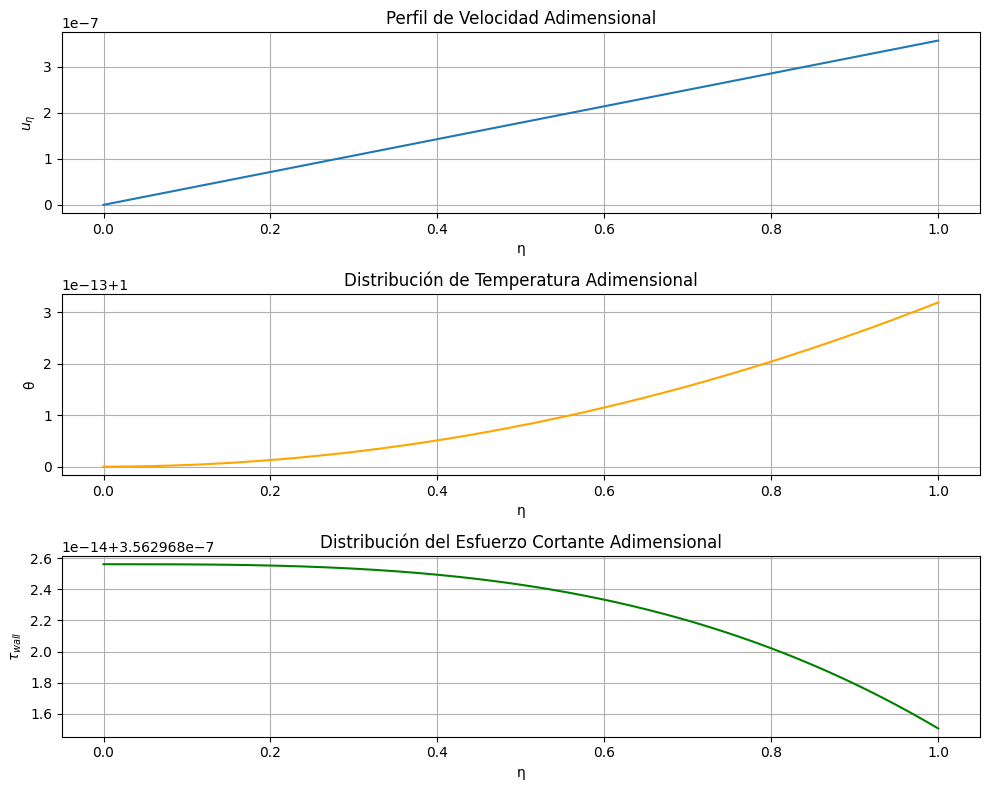

In [15]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

# Parámetros del problema
rho = 1.225  # Densidad del aire [kg/m³]
u_inf = 100  # Velocidad del aire a la entrada [m/s]
mu = 1.7894e-5  # Viscosidad dinámica del aire [Pa·s]
k = 0.0257  # Conductividad térmica del aire [W/m·K]
cp = 1006  # Capacidad calorífica del aire a presión constante [J/kg·K]
L = 1  # Longitud característica [m]
H = 0.5  # Altura [m]
T_inf = 300  # Temperatura a la entrada [K]
T_max = 350  # Temperatura en la pared [K]

# Cálculo de parámetros derivados
h_max = cp * T_max  # Coeficiente de transferencia de calor en la pared [W/m²·K]
h_inf = cp * T_inf  # Coeficiente de transferencia de calor a la entrada [W/m²·K]
Re = rho * u_inf * L / mu  # Número de Reynolds
Pr = mu * cp / k  # Número de Prandtl
Lambda = L / H  # Relación de aspecto
beta = (h_max - h_inf) / u_inf**2  # Relación para la disipación térmica

# Definimos las ecuaciones diferenciales del problema (Blasius + Energía)
def blasius_system(eta, y):
    """
    Sistema de ecuaciones diferenciales para el problema de Blasius con transferencia térmica.
    """
    f, f_prime, f_double_prime, theta, theta_prime = y
    
    # Ecuaciones diferenciales
    df_deta = f_prime
    df_prime_deta = f_double_prime
    df_double_prime_deta = -0.5 * f * f_double_prime
    dtheta_deta = theta_prime
    dtheta_prime_deta = -Pr * f * theta_prime + beta * (f_double_prime ** 2)
    
    return [df_deta, df_prime_deta, df_double_prime_deta, dtheta_deta, dtheta_prime_deta]

# Condiciones iniciales para el sistema completo (Blasius + Energía)
def initial_conditions():
    """
    Condiciones iniciales para el problema:
    - f(0) = 0: No hay flujo en la pared.
    - f'(0) = 0: Velocidad tangencial inicial es cero.
    - f''(0): Estimado inicialmente como un valor típico (se ajustará numéricamente).
    - θ(0) = 1: Temperatura adimensional en la pared.
    - θ'(0) = 0: Gradiente térmico inicial.
    """
    return [0.0, 0.0, calculate_fpp_0(), 1.0, 0.0]  

# Resolver el sistema utilizando el método de disparo
def solve_blasius():
    """
    Resuelve las ecuaciones diferenciales del problema de Blasius con transferencia térmica.
    """
    eta_span = (0, 1)  # Rango para η (normalizado) Puedo cambiar a 10 para ver más allá de la capa límite.
    eta_eval = np.linspace(*eta_span, 500)  # Puntos donde evaluar la solución
    
    # Resolver las ecuaciones diferenciales
    sol = solve_ivp(blasius_system, eta_span, initial_conditions(), t_eval=eta_eval, method='RK45')
    
    if sol.success:
        return sol.t, sol.y
    else:
        raise RuntimeError("No se pudo resolver el sistema.")

# Cálculo de f''(0)
def calculate_fpp_0():
    """
    Calcula el valor de f''(0), que corresponde al gradiente adimensional de velocidad en la pared.
    
    Este valor es crítico porque está relacionado con el esfuerzo cortante en la pared y,
    por lo tanto, con el coeficiente de fricción.
    
    El cálculo se realiza resolviendo únicamente las ecuaciones básicas de Blasius:
        f''' + (1/2) * f * f'' = 0,
        con las condiciones iniciales:
        f(0) = 0,
        f'(0) = 0,
        y un valor inicial estimado para f''(0).
    
    Retorna:
        - El valor calculado numéricamente de f''(0).
    """
    
    def blasius_basic_system(eta, y):
        """
        Sistema reducido solo para las ecuaciones básicas de Blasius.
        """
        f, f_prime, f_double_prime = y
        
        df_deta = f_prime
        df_prime_deta = f_double_prime
        df_double_prime_deta = -0.5 * f * f_double_prime
        
        return [df_deta, df_prime_deta, df_double_prime_deta]

    def initial_conditions_basic():
        """
        Condiciones iniciales básicas para Blasius:
            - f(0) = 0,
            - f'(0) = 0,
            - Valor inicial estimado para f''(0).
        """
        return [0.0, 0.0, 1.0]  

    eta_span_basic = (0, 10)  # Rango extendido para asegurar convergencia a condiciones asintóticas.
    
    sol_basic = solve_ivp(
        blasius_basic_system,
        eta_span_basic,
        initial_conditions_basic(),
        t_eval=[10],   # Solo necesitamos evaluar al final del dominio.
        method='RK45'
    )
    
    if sol_basic.success:
        return sol_basic.y[2][0]   # Retorna el valor calculado numéricamente.

# Ejecutar la solución completa y calcular resultados
fpp_0_calculated = calculate_fpp_0()
print(f"El valor calculado numéricamente de f''(0) es: {fpp_0_calculated}")

# Resolver el sistema completo (Blasius + Energía)
eta, results = solve_blasius()
f = results[0]
f_prime = results[1]
f_double_prime = results[2]
theta = results[3]

# Graficar los resultados
plt.figure(figsize=(10, 8))

# Perfil de velocidad adimensional u/U∞
plt.subplot(3, 1, 1)
plt.plot(eta, f_prime, label="u/U_inf")
plt.title("Perfil de Velocidad Adimensional")
plt.xlabel("η")
plt.ylabel(r"$u_\eta$")
plt.grid(True)
#plt.legend()

# Distribución de temperatura θ
plt.subplot(3, 1, 2)
plt.plot(eta, theta, label="θ", color="orange")
plt.title("Distribución de Temperatura Adimensional")
plt.xlabel("η")
plt.ylabel("θ")
plt.grid(True)
#plt.legend()

# Distribución del esfuerzo cortante τ_wall (proporcional a f''(η))
plt.subplot(3, 1, 3)
plt.plot(eta, f_double_prime, label="τ_wall", color="green")
plt.title("Distribución del Esfuerzo Cortante Adimensional")
plt.xlabel("η")
plt.ylabel(r"$\tau_{wall}$")
plt.grid(True)
#plt.legend()

# Mostrar gráficos
plt.tight_layout()
plt.show()


El valor calculado numéricamente de f''(0) es: 3.5629682562070225e-07


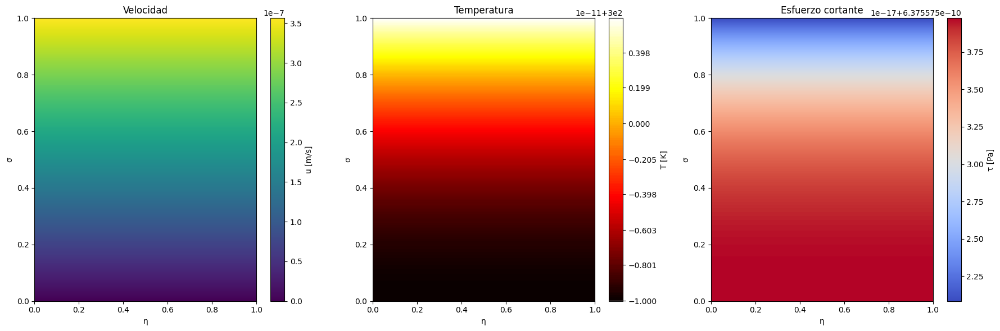

3.192727754077814e-13


In [27]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

# Parámetros del problema
rho = 1.225  # Densidad del aire [kg/m³]
u_inf = 100  # Velocidad del aire a la entrada [m/s]
mu = 1.7894e-5  # Viscosidad dinámica del aire [Pa·s]
k = 0.0257  # Conductividad térmica del aire [W/m·K]
cp = 1006  # Capacidad calorífica del aire a presión constante [J/kg·K]
L = 1  # Longitud característica [m]
H = 0.5  # Altura [m]
T_inf = 300  # Temperatura a la entrada [K]
T_max = 350  # Temperatura en la pared [K]

# Cálculo de parámetros derivados
h_max = cp * T_max  # Coeficiente de transferencia de calor en la pared [W/m²·K]
h_inf = cp * T_inf  # Coeficiente de transferencia de calor a la entrada [W/m²·K]
Re = rho * u_inf * L / mu  # Número de Reynolds
Pr = mu * cp / k  # Número de Prandtl
Lambda = L / H  # Relación de aspecto
beta = (h_max - h_inf) / u_inf**2  # Relación para la disipación térmica

# Definimos las ecuaciones diferenciales del problema (Blasius + Energía)
def blasius_system(eta, y):
    """
    Sistema de ecuaciones diferenciales para el problema de Blasius con transferencia térmica.
    """
    f, f_prime, f_double_prime, theta, theta_prime = y
    
    # Ecuaciones diferenciales
    df_deta = f_prime
    df_prime_deta = f_double_prime
    df_double_prime_deta = -0.5 * f * f_double_prime
    dtheta_deta = theta_prime
    dtheta_prime_deta = -Pr * f * theta_prime + beta * (f_double_prime ** 2)
    
    return [df_deta, df_prime_deta, df_double_prime_deta, dtheta_deta, dtheta_prime_deta]

# Condiciones iniciales para el sistema completo (Blasius + Energía)
def initial_conditions():
    """
    Condiciones iniciales para el problema:
    - f(0) = 0: No hay flujo en la pared.
    - f'(0) = 0: Velocidad tangencial inicial es cero.
    - f''(0): Estimado inicialmente como un valor típico (se ajustará numéricamente).
    - θ(0) = 0: Temperatura adimensional en la pared.
    - θ'(0) = 0: Gradiente térmico inicial.
    """
    return [0.0, 0.0, calculate_fpp_0(), 0.0, 0.0]  

# Resolver el sistema utilizando el método de disparo
def solve_blasius():
    """
    Resuelve las ecuaciones diferenciales del problema de Blasius con transferencia térmica.
    """
    eta_span = (0, 1)  # Rango para η (normalizado) Puedo cambiar a 10 para ver más allá de la capa límite.
    eta_eval = np.linspace(*eta_span, 500)  # Puntos donde evaluar la solución
    
    # Resolver las ecuaciones diferenciales
    sol = solve_ivp(blasius_system, eta_span, initial_conditions(), t_eval=eta_eval, method='RK45')
    
    if sol.success:
        return sol.t, sol.y
    else:
        raise RuntimeError("No se pudo resolver el sistema.")

# Cálculo de f''(0)
def calculate_fpp_0():
    """
    Calcula el valor de f''(0), que corresponde al gradiente adimensional de velocidad en la pared.
    
    Este valor es crítico porque está relacionado con el esfuerzo cortante en la pared y,
    por lo tanto, con el coeficiente de fricción.
    
    El cálculo se realiza resolviendo únicamente las ecuaciones básicas de Blasius:
        f''' + (1/2) * f * f'' = 0,
        con las condiciones iniciales:
        f(0) = 0,
        f'(0) = 0,
        y un valor inicial estimado para f''(0).
    
    Retorna:
        - El valor calculado numéricamente de f''(0).
    """
    
    def blasius_basic_system(eta, y):
        """
        Sistema reducido solo para las ecuaciones básicas de Blasius.
        """
        f, f_prime, f_double_prime = y
        
        df_deta = f_prime
        df_prime_deta = f_double_prime
        df_double_prime_deta = -0.5 * f * f_double_prime
        
        return [df_deta, df_prime_deta, df_double_prime_deta]

    def initial_conditions_basic():
        """
        Condiciones iniciales básicas para Blasius:
            - f(0) = 0,
            - f'(0) = 0,
            - Valor inicial estimado para f''(0).
        """
        return [0.0, 0.0, 1.0]  

    eta_span_basic = (0, 10)  # Rango extendido para asegurar convergencia a condiciones asintóticas.
    
    sol_basic = solve_ivp(
        blasius_basic_system,
        eta_span_basic,
        initial_conditions_basic(),
        t_eval=[10],   # Solo necesitamos evaluar al final del dominio.
        method='RK45'
    )
    
    if sol_basic.success:
        return sol_basic.y[2][0]   # Retorna el valor calculado numéricamente.

# Ejecutar la solución completa y calcular resultados
fpp_0_calculated = calculate_fpp_0()
print(f"El valor calculado numéricamente de f''(0) es: {fpp_0_calculated}")

# Definir la malla para eta y sigma
n_eta = 100
n_sigma = 100
eta = np.linspace(0, 1, n_eta)
sigma = np.linspace(0, 1, n_sigma)
eta_mesh, sigma_mesh = np.meshgrid(eta, sigma)

# Resolver el sistema de Blasius
eta, results = solve_blasius()
f = results[0]
f_prime = results[1]
f_double_prime = results[2]
theta = results[3]

# Calcular velocidad, temperatura y esfuerzo cortante en la malla 2D
u = np.outer(f_prime, np.ones(n_sigma))
T = T_inf + (T_max - T_inf) * np.outer(theta, np.ones(n_sigma))
tau = mu * u_inf / L * np.outer(f_double_prime, np.ones(n_sigma))

# Crear los gráficos
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

# Velocidad
im1 = ax1.imshow(u, extent=[0, 1, 0, 1], origin='lower', aspect='auto', cmap='viridis')
ax1.set_title('Velocidad')
ax1.set_xlabel('η')
ax1.set_ylabel('σ')
fig.colorbar(im1, ax=ax1, label='u [m/s]')

# Temperatura
im2 = ax2.imshow(T, extent=[0, 1, 0, 1], origin='lower', aspect='auto', cmap='hot')
ax2.set_title('Temperatura')
ax2.set_xlabel('η')
ax2.set_ylabel('σ')
fig.colorbar(im2, ax=ax2, label='T [K]')

# Esfuerzo cortante
im3 = ax3.imshow(tau, extent=[0, 1, 0, 1], origin='lower', aspect='auto', cmap='coolwarm')
ax3.set_title('Esfuerzo cortante')
ax3.set_xlabel('η')
ax3.set_ylabel('σ')
fig.colorbar(im3, ax=ax3, label='τ [Pa]')

plt.tight_layout()
plt.show()

print(max(theta))

El valor calculado numéricamente de f''(0) es: 3.5629682562070225e-07


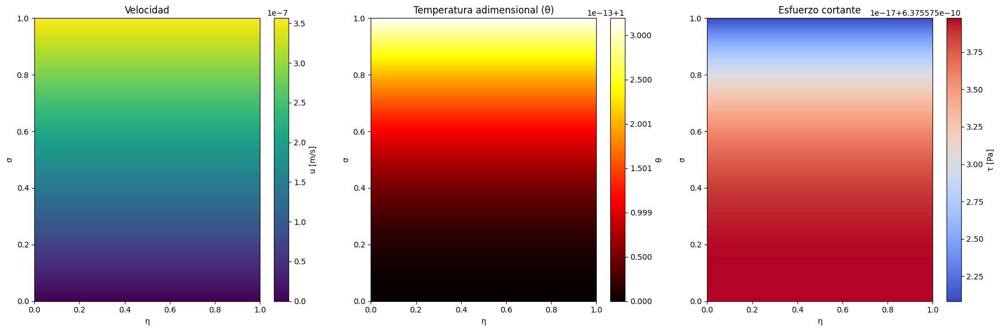

In [24]:
# Represento theta en lugar de temperaturas

import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

# Parámetros del problema
rho = 1.225  # Densidad del aire [kg/m³]
u_inf = 100  # Velocidad del aire a la entrada [m/s]
mu = 1.7894e-5  # Viscosidad dinámica del aire [Pa·s]
k = 0.0257  # Conductividad térmica del aire [W/m·K]
cp = 1006  # Capacidad calorífica del aire a presión constante [J/kg·K]
L = 1  # Longitud característica [m]
H = 0.5  # Altura [m]
T_inf = 300  # Temperatura a la entrada [K]
T_max = 350  # Temperatura en la pared [K]

# Cálculo de parámetros derivados
h_max = cp * T_max  # Coeficiente de transferencia de calor en la pared [W/m²·K]
h_inf = cp * T_inf  # Coeficiente de transferencia de calor a la entrada [W/m²·K]
Re = rho * u_inf * L / mu  # Número de Reynolds
Pr = mu * cp / k  # Número de Prandtl
Lambda = L / H  # Relación de aspecto
beta = (h_max - h_inf) / u_inf**2  # Relación para la disipación térmica

# Definimos las ecuaciones diferenciales del problema (Blasius + Energía)
def blasius_system(eta, y):
    """
    Sistema de ecuaciones diferenciales para el problema de Blasius con transferencia térmica.
    """
    f, f_prime, f_double_prime, theta, theta_prime = y
    
    # Ecuaciones diferenciales
    df_deta = f_prime
    df_prime_deta = f_double_prime
    df_double_prime_deta = -0.5 * f * f_double_prime
    dtheta_deta = theta_prime
    dtheta_prime_deta = -Pr * f * theta_prime + beta * (f_double_prime ** 2)
    
    return [df_deta, df_prime_deta, df_double_prime_deta, dtheta_deta, dtheta_prime_deta]

# Condiciones iniciales para el sistema completo (Blasius + Energía)
def initial_conditions():
    """
    Condiciones iniciales para el problema:
    - f(0) = 0: No hay flujo en la pared.
    - f'(0) = 0: Velocidad tangencial inicial es cero.
    - f''(0): Estimado inicialmente como un valor típico (se ajustará numéricamente).
    - θ(0) = 1: Temperatura adimensional en la pared.
    - θ'(0) = 0: Gradiente térmico inicial.
    """
    return [0.0, 0.0, calculate_fpp_0(), 1.0, 0.0]  

# Resolver el sistema utilizando el método de disparo
def solve_blasius():
    """
    Resuelve las ecuaciones diferenciales del problema de Blasius con transferencia térmica.
    """
    eta_span = (0, 1)  # Rango para η (normalizado) Puedo cambiar a 10 para ver más allá de la capa límite.
    eta_eval = np.linspace(*eta_span, 500)  # Puntos donde evaluar la solución
    
    # Resolver las ecuaciones diferenciales
    sol = solve_ivp(blasius_system, eta_span, initial_conditions(), t_eval=eta_eval, method='RK45')
    
    if sol.success:
        return sol.t, sol.y
    else:
        raise RuntimeError("No se pudo resolver el sistema.")

# Cálculo de f''(0)
def calculate_fpp_0():
    """
    Calcula el valor de f''(0), que corresponde al gradiente adimensional de velocidad en la pared.
    
    Este valor es crítico porque está relacionado con el esfuerzo cortante en la pared y,
    por lo tanto, con el coeficiente de fricción.
    
    El cálculo se realiza resolviendo únicamente las ecuaciones básicas de Blasius:
        f''' + (1/2) * f * f'' = 0,
        con las condiciones iniciales:
        f(0) = 0,
        f'(0) = 0,
        y un valor inicial estimado para f''(0).
    
    Retorna:
        - El valor calculado numéricamente de f''(0).
    """
    
    def blasius_basic_system(eta, y):
        """
        Sistema reducido solo para las ecuaciones básicas de Blasius.
        """
        f, f_prime, f_double_prime = y
        
        df_deta = f_prime
        df_prime_deta = f_double_prime
        df_double_prime_deta = -0.5 * f * f_double_prime
        
        return [df_deta, df_prime_deta, df_double_prime_deta]

    def initial_conditions_basic():
        """
        Condiciones iniciales básicas para Blasius:
            - f(0) = 0,
            - f'(0) = 0,
            - Valor inicial estimado para f''(0).
        """
        return [0.0, 0.0, 1.0]  

    eta_span_basic = (0, 10)  # Rango extendido para asegurar convergencia a condiciones asintóticas.
    
    sol_basic = solve_ivp(
        blasius_basic_system,
        eta_span_basic,
        initial_conditions_basic(),
        t_eval=[10],   # Solo necesitamos evaluar al final del dominio.
        method='RK45'
    )
    
    if sol_basic.success:
        return sol_basic.y[2][0]   # Retorna el valor calculado numéricamente.

# Ejecutar la solución completa y calcular resultados
fpp_0_calculated = calculate_fpp_0()
print(f"El valor calculado numéricamente de f''(0) es: {fpp_0_calculated}")

# Definir la malla para eta y sigma
n_eta = 100
n_sigma = 100
eta = np.linspace(0, 1, n_eta)
sigma = np.linspace(0, 1, n_sigma)
eta_mesh, sigma_mesh = np.meshgrid(eta, sigma)

# Resolver el sistema de Blasius
eta, results = solve_blasius()
f = results[0]
f_prime = results[1]
f_double_prime = results[2]
theta = results[3]

# Calcular velocidad, theta y esfuerzo cortante en la malla 2D
u = np.outer(f_prime, np.ones(n_sigma))
theta_2D = np.outer(theta, np.ones(n_sigma))
tau = mu * u_inf / L * np.outer(f_double_prime, np.ones(n_sigma))

# Crear los gráficos
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

# Velocidad
im1 = ax1.imshow(u, extent=[0, 1, 0, 1], origin='lower', aspect='auto', cmap='viridis')
ax1.set_title('Velocidad')
ax1.set_xlabel('η')
ax1.set_ylabel('σ')
fig.colorbar(im1, ax=ax1, label='u [m/s]')

# Theta
im2 = ax2.imshow(theta_2D, extent=[0, 1, 0, 1], origin='lower', aspect='auto', cmap='hot')
ax2.set_title('Temperatura adimensional (θ)')
ax2.set_xlabel('η')
ax2.set_ylabel('σ')
fig.colorbar(im2, ax=ax2, label='θ')

# Esfuerzo cortante
im3 = ax3.imshow(tau, extent=[0, 1, 0, 1], origin='lower', aspect='auto', cmap='coolwarm')
ax3.set_title('Esfuerzo cortante')
ax3.set_xlabel('η')
ax3.set_ylabel('σ')
fig.colorbar(im3, ax=ax3, label='τ [Pa]')

plt.tight_layout()
plt.show()


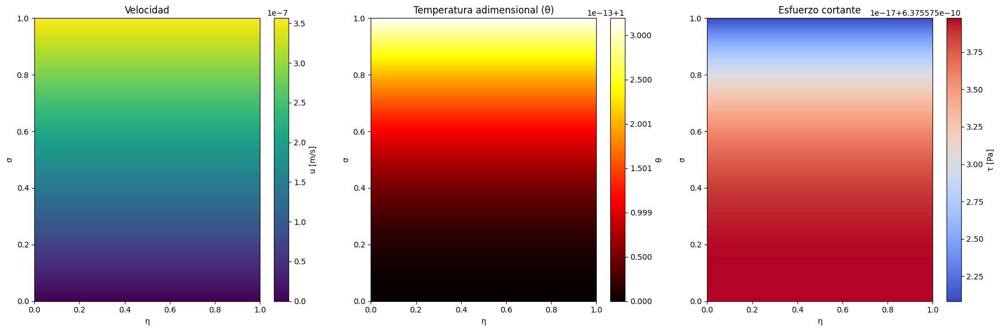

In [25]:
# Represento theta en lugar de temperaturas

import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

# Parámetros del problema
rho = 1.225  # Densidad del aire [kg/m³]
u_inf = 100  # Velocidad del aire a la entrada [m/s]
mu = 1.7894e-5  # Viscosidad dinámica del aire [Pa·s]
k = 0.0257  # Conductividad térmica del aire [W/m·K]
cp = 1006  # Capacidad calorífica del aire a presión constante [J/kg·K]
L = 1  # Longitud característica [m]
H = 0.5  # Altura [m]
T_inf = 300  # Temperatura a la entrada [K]
T_max = 350  # Temperatura en la pared [K]

# Cálculo de parámetros derivados
h_max = cp * T_max  # Coeficiente de transferencia de calor en la pared [W/m²·K]
h_inf = cp * T_inf  # Coeficiente de transferencia de calor a la entrada [W/m²·K]
Re = rho * u_inf * L / mu  # Número de Reynolds
Pr = mu * cp / k  # Número de Prandtl
Lambda = L / H  # Relación de aspecto
beta = (h_max - h_inf) / u_inf**2  # Relación para la disipación térmica

# Definimos las ecuaciones diferenciales del problema (Blasius + Energía)
def blasius_system(eta, y):
    """
    Sistema de ecuaciones diferenciales para el problema de Blasius con transferencia térmica.
    """
    f, f_prime, f_double_prime, theta, theta_prime = y
    
    # Ecuaciones diferenciales
    df_deta = f_prime
    df_prime_deta = f_double_prime
    df_double_prime_deta = -0.5 * f * f_double_prime
    dtheta_deta = theta_prime
    dtheta_prime_deta = -Pr * f * theta_prime + beta * (f_double_prime ** 2)
    
    return [df_deta, df_prime_deta, df_double_prime_deta, dtheta_deta, dtheta_prime_deta]

# Condiciones iniciales para el sistema completo (Blasius + Energía)
def initial_conditions():
    """
    Condiciones iniciales para el problema:
    - f(0) = 0: No hay flujo en la pared.
    - f'(0) = 0: Velocidad tangencial inicial es cero.
    - f''(0): Estimado inicialmente como un valor típico (se ajustará numéricamente).
    - θ(0) = 1: Temperatura adimensional en la pared.
    - θ'(0) = 0: Gradiente térmico inicial.
    """
    return [0.0, 0.0, calculate_fpp_0(), 1.0, 0.0]  

# Resolver el sistema utilizando el método de disparo
def solve_blasius():
    """
    Resuelve las ecuaciones diferenciales del problema de Blasius con transferencia térmica.
    """
    eta_span = (0, 1)  # Rango para η (normalizado) Puedo cambiar a 10 para ver más allá de la capa límite.
    eta_eval = np.linspace(*eta_span, 500)  # Puntos donde evaluar la solución
    
    # Resolver las ecuaciones diferenciales
    sol = solve_ivp(blasius_system, eta_span, initial_conditions(), t_eval=eta_eval, method='RK45')
    
    if sol.success:
        return sol.t, sol.y
    else:
        raise RuntimeError("No se pudo resolver el sistema.")

# Cálculo de f''(0)
def calculate_fpp_0():
    """
    Calcula el valor de f''(0), que corresponde al gradiente adimensional de velocidad en la pared.
    
    Este valor es crítico porque está relacionado con el esfuerzo cortante en la pared y,
    por lo tanto, con el coeficiente de fricción.
    
    El cálculo se realiza resolviendo únicamente las ecuaciones básicas de Blasius:
        f''' + (1/2) * f * f'' = 0,
        con las condiciones iniciales:
        f(0) = 0,
        f'(0) = 0,
        y un valor inicial estimado para f''(0).
    
    Retorna:
        - El valor calculado numéricamente de f''(0).
    """
    
    def blasius_basic_system(eta, y):
        """
        Sistema reducido solo para las ecuaciones básicas de Blasius.
        """
        f, f_prime, f_double_prime = y
        
        df_deta = f_prime
        df_prime_deta = f_double_prime
        df_double_prime_deta = -0.5 * f * f_double_prime
        
        return [df_deta, df_prime_deta, df_double_prime_deta]

    def initial_conditions_basic():
        """
        Condiciones iniciales básicas para Blasius:
            - f(0) = 0,
            - f'(0) = 0,
            - Valor inicial estimado para f''(0).
        """
        return [0.0, 0.0, 1.0]  

    eta_span_basic = (0, 10)  # Rango extendido para asegurar convergencia a condiciones asintóticas.
    
    sol_basic = solve_ivp(
        blasius_basic_system,
        eta_span_basic,
        initial_conditions_basic(),
        t_eval=[10],   # Solo necesitamos evaluar al final del dominio.
        method='RK45'
    )
    
    if sol_basic.success:
        return sol_basic.y[2][0]   # Retorna el valor calculado numéricamente.

# Definir la malla para eta y sigma
n_eta = 100
n_sigma = 100
eta = np.linspace(0, 1, n_eta)
sigma = np.linspace(0, 1, n_sigma)
eta_mesh, sigma_mesh = np.meshgrid(eta, sigma)

# Resolver el sistema de Blasius
eta, results = solve_blasius()
f = results[0]
f_prime = results[1]
f_double_prime = results[2]
theta = results[3]

# Calcular velocidad, theta y esfuerzo cortante en la malla 2D
u = np.outer(f_prime, np.ones(n_sigma))
theta_2D = np.outer(theta, np.ones(n_sigma))
tau = mu * u_inf / L * np.outer(f_double_prime, np.ones(n_sigma))

# Crear los gráficos
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

# Velocidad
im1 = ax1.imshow(u, extent=[0, 1, 0, 1], origin='lower', aspect='auto', cmap='viridis')
ax1.set_title('Velocidad')
ax1.set_xlabel('η')
ax1.set_ylabel('σ')
fig.colorbar(im1, ax=ax1, label='u [m/s]')

# Theta
im2 = ax2.imshow(theta_2D, extent=[0, 1, 0, 1], origin='lower', aspect='auto', cmap='hot')
ax2.set_title('Temperatura adimensional (θ)')
ax2.set_xlabel('η')
ax2.set_ylabel('σ')
fig.colorbar(im2, ax=ax2, label='θ')

# Esfuerzo cortante
im3 = ax3.imshow(tau, extent=[0, 1, 0, 1], origin='lower', aspect='auto', cmap='coolwarm')
ax3.set_title('Esfuerzo cortante')
ax3.set_xlabel('η')
ax3.set_ylabel('σ')
fig.colorbar(im3, ax=ax3, label='τ [Pa]')

plt.tight_layout()
plt.show()


## Calculo de shear stress

El esfuerzo cortante (**_shear stress_**) en la pared ($ \tau_{\text{wall}} $) se calcula a partir del gradiente de velocidad en la superficie de la placa plana. En el modelo de Blasius, esto está directamente relacionado con la segunda derivada de la función de corriente adimensional $ f''(\eta) $. Aquí te explico cómo se realiza el cálculo en el código:

---

### **1. Fórmula del esfuerzo cortante**

El esfuerzo cortante dimensional en la pared se define como:
$
\tau_{\text{wall}} = \mu \left. \frac{\partial u_x}{\partial y} \right|_{y=0},
$
donde:
- $\mu$ es la viscosidad dinámica del fluido,
- $u_x$ es la velocidad en la dirección paralela a la placa,
- $y$ es la coordenada perpendicular a la placa.

---

### **2. Adimensionalización**

En el modelo de Blasius, las variables se normalizan usando:
- $ u_x = u_\infty \cdot u_\eta $,
- $ y = H \cdot \sigma $ (donde $ H = \delta $ es el espesor de la capa límite).

El gradiente de velocidad adimensional se relaciona con $ f''(\eta) $ mediante:
$
\left. \frac{\partial u_x}{\partial y} \right|_{y=0} = u_\infty \cdot \frac{\partial u_\eta}{\partial \sigma} \cdot \frac{1}{H}.
$

El esfuerzo cortante adimensional se define como:
$
\tau_{\text{wall, adim}} = f''(0),
$
y el esfuerzo cortante dimensional se obtiene escalando:
$
\tau_{\text{wall}} = \mu \cdot \frac{u_\infty}{H} \cdot f''(0).
$

---

### **3. Implementación en el Código**

En el código proporcionado, el esfuerzo cortante se calcula directamente a partir de la segunda derivada de la función de corriente $ f''(\eta) $, que es una de las variables del sistema de ecuaciones diferenciales. 

#### Pasos clave:
1. **Resolución de las ecuaciones de Blasius**:
   ```python
   def blasius_system(eta, y):
       f, f_prime, f_double_prime, theta, theta_prime = y
       # Ecuaciones diferenciales
       df_double_prime_deta = -0.5 * f * f_double_prime
       return [df_deta, df_prime_deta, df_double_prime_deta, ...]
   ```
   - $ f''(\eta) $ se resuelve numéricamente como parte del sistema.

2. **Condición inicial para $ f''(0) $**:
   - El valor inicial $ f''(0) \approx 0.33206 $ se ajusta numéricamente para garantizar que $ f'(\infty) \to 1 $ (condición de frontera asintótica).

3. **Cálculo del esfuerzo cortante**:
   - La solución numérica devuelve $ f''(\eta) $ para todo el dominio $ \eta \in [0,
   - El esfuerzo cortante adimensional es proporcional a $ f''(\eta) $, y su valor en la pared ($ \eta = 0 $) es:
     ```python
     f_double_prime = results[2]  # f''(η)
     tau_wall_adim = f_double_prime[0]  # f''(0)
     ```

4. **Conversión a esfuerzo cortante dimensional** (opcional):
   ```python
   tau_wall_dim = mu * u_inf / H * tau_wall_adim
   ```

---

### **4. Gráfico del esfuerzo cortante**

El código representa $ f''(\eta) $ como la distribución del esfuerzo cortante adimensional:
```python
plt.plot(eta, f_double_prime, label="τ_wall", color="green")
```
- **Eje vertical (τ_wall)**: Corresponde al valor de $ f''(\eta) $.
- **Eje horizontal (η)**: Coordenada adimensional normalizada.

---

### **5. Resultados Esperados**

- **En la pared (η = 0)**:
  - El esfuerzo cortante adimensional es máximo: $ f''(0) \approx 0.332 $.
  - Esto coincide con la solución clásica de Blasius para capas límite laminares.

- **Lejos de la pared (η → 1)**:
  - El esfuerzo cortante disminuye gradualmente hasta cero, reflejando que el flujo se vuelve uniforme ($ u_x \to u_\infty $).

---

### **6. Parámetros que afectan al esfuerzo cortante**

- **Viscosidad (μ)**: A mayor viscosidad, mayor esfuerzo cortante.
- **Velocidad del flujo (u_inf)**: A mayor velocidad, mayor gradiente de velocidad en la pared.
- **Espesor de la capa límite (H)**: Inversamente proporcional al esfuerzo cortante.

---

Este enfoque permite resolver el perfil de esfuerzo cortante de manera eficiente utilizando métodos numéricos, evitando cálculos analíticos complejos.

---

---

## NO ESTACIONARIO

Para incorporar la variación temporal en el problema de la capa límite sobre una placa plana, las ecuaciones del modelo deben modificarse para incluir términos de derivadas parciales respecto al tiempo. Esto cambia radicalmente la naturaleza del problema, pasando de un sistema de **ecuaciones diferenciales ordinarias (EDO)** en régimen estacionario a un sistema de **ecuaciones diferenciales en derivadas parciales (EDP)** no estacionarias. A continuación, se explica cómo se modificaría el modelo y qué implicaciones tendría.

---

### **1. Ecuaciones modificadas con términos temporales**
Las ecuaciones de conservación (masa, momento y energía) incluirían ahora derivadas temporales:

#### **a. Conservación de masa**:
$
\partial_t \rho + \partial_x (\rho u_x) + \partial_y (\rho u_y) = 0 \quad \text{(si el fluido es compresible)}.
$

#### **b. Conservación de momento en $x$**:
$
\rho \left( \partial_t u_x + u_x \partial_x u_x + u_y \partial_y u_x \right) = \mu \partial_y^2 u_x.
$

#### **c. Conservación de energía**:
$
\rho \left( \partial_t h + u_x \partial_x h + u_y \partial_y h \right) = \frac{\mu}{Pr} \partial_y^2 h + \mu (\partial_y u_x)^2.
$

---

### **2. Implicaciones de la variación temporal**
- **Pérdida de similitud de Blasius**: La solución autosimilar de Blasius (basada en la variable $\eta = y \sqrt{u_\infty / (\nu x)}$) ya no es aplicable, ya que el tiempo introduce una variable independiente adicional.
- **Condiciones iniciales**: Se requiere especificar perfiles iniciales de velocidad y temperatura en $t = 0$.
- **Mayor complejidad matemática**: El sistema se convierte en un problema de EDP parabólico no lineal, que generalmente requiere métodos numéricos avanzados.

---

### **3. Ejemplo físico: Arranque de una placa plana**
Un caso clásico con variación temporal es el flujo sobre una placa plana que comienza a moverse abruptamente en un fluido en reposo. En este escenario:
- **Condiciones iniciales**:
  - $u_x(x, y, 0) = 0$ (fluido en reposo).
  - $h(x, y, 0) = h_\infty$ (temperatura uniforme).
- **Condiciones de contorno**:
  - $u_x(x, 0, t) = 0$ (sin deslizamiento en la pared para $t > 0$).
  - $u_x(x, \infty, t) = u_\infty$ (flujo libre para $t > 0$).
  - $h(x, 0, t) = h_{\text{max}}$ (pared isotérmica).

---

### **4. Métodos numéricos para resolver el problema no estacionario**
#### **a. Discretización temporal**
Se utiliza un esquema de paso temporal (e.g., Euler explícito, Crank-Nicolson) para avanzar en el tiempo. Por ejemplo, para la velocidad $u_x$:
$
\frac{u_x^{n+1} - u_x^n}{\Delta t} = \text{Términos espaciales} \ (u_x^n, u_y^n).
$

#### **b. Discretización espacial**
Se discretizan las derivadas espaciales usando diferencias finitas, elementos finitos o volúmenes finitos. Por ejemplo:
$
\partial_y^2 u_x \approx \frac{u_x|_{y+\Delta y} - 2u_x|_y + u_x|_{y-\Delta y}}{(\Delta y)^2}.
$

#### **c. Acoplamiento presión-velocidad**
Si el fluido es incompresible, se necesita resolver la ecuación de presión (e.g., método SIMPLE o proyección).

---

### **5. Implementación en Python (Esquema simplificado)**
Aquí se muestra un ejemplo simplificado usando el **método de las líneas** (discretización espacial + integración temporal con `solve_ivp`):

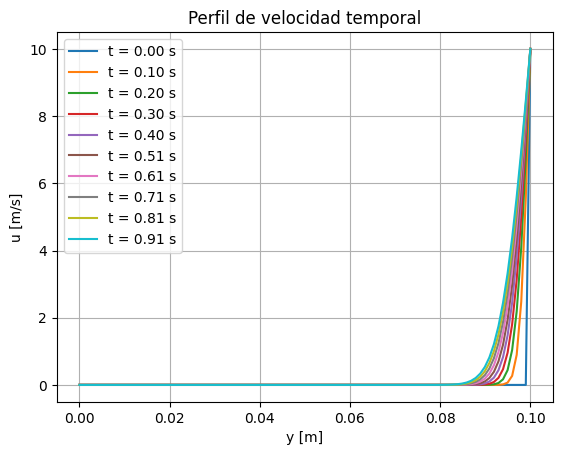

In [5]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

# Parámetros
rho = 1.225
mu = 1.789e-5
u_inf = 10.0
ny = 100  # Puntos en y
y_max = 0.1  # Dominio en y [m]
dy = y_max / ny
y = np.linspace(0, y_max, ny)
dt = 0.001  # Paso temporal [s]
t_max = 1.0  # Tiempo máximo [s]

# Condición inicial: fluido en reposo
u = np.zeros(ny)
u[-1] = u_inf  # Flujo libre en y_max

# Sistema de EDOs (discretización espacial)
def dudt(t, u):
    dudt = np.zeros_like(u)
    for i in range(1, ny-1):
        # Términos convectivos y viscosos (simplificado)
        dudt[i] = (mu / rho) * (u[i+1] - 2*u[i] + u[i-1]) / dy**2
    return dudt

# Resolver en el tiempo
sol = solve_ivp(dudt, [0, t_max], u, method='BDF', t_eval=np.linspace(0, t_max, 100))

# Visualización
for t_idx in range(0, len(sol.t), 10):
    plt.plot(y, sol.y[:, t_idx], label=f"t = {sol.t[t_idx]:.2f} s")
plt.xlabel("y [m]")
plt.ylabel("u [m/s]")
plt.title("Perfil de velocidad temporal")
plt.legend()
plt.grid()
plt.show()

---

### **6. Desafíos clave**
1. **Estabilidad numérica**: Esquemas explícitos requieren $\Delta t \leq \frac{\rho (\Delta y)^2}{2 \mu}$ (condición CFL).
2. **Acoplamiento no lineal**: Los términos convectivos ($u \partial u / \partial x$) introducen no linealidad, requiriendo iteraciones.
3. **Coste computacional**: La resolución 2D+tiempo es mucho más costosa que el caso estacionario 1D.

---

### **7. Casos de estudio relevantes**
- **Problema de Stokes (placa oscilante)**: Solución analítica para $u(y, t)$ cuando la placa se mueve con $u(0, t) = U_0 \sin(\omega t)$.
- **Desarrollo temporal de la capa límite**: Cómo crece el espesor de la capa límite $\delta(t)$ desde $t = 0$.

---

### **8. Herramientas recomendadas**
- **Librerías avanzadas**: Para problemas complejos, usar `FENICS` (elementos finitos) o `OpenFOAM` (volúmenes finitos).
- **GPU computing**: Acelerar cálculos con `CUDA` o `PyTorch`.

---

Incluir la variación temporal convierte el problema en uno significativamente más complejo, pero permite estudiar fenómenos transitorios como el arranque de flujos, inestabilidades o efectos de fluctuaciones térmicas.

---

## TRANSITORIO (BLASIUS)

Modelo para un fluido en contacto con una placa plana, considero ecuación de la energía.

-  Ecuaciones del problema (suponiendo propiedades del fluido constantes):

1. $\partial_x u_x + \partial_y u_y = 0$
2. $\rho (\partial_t u + u_x \partial_x u_x + u_y \partial_y u_x) = \mu (\partial_y^2 u_x)$
3. $\rho (\partial_t h + u_x \partial_x h + u_y \partial_y h) = \frac{\mu}{Pr} \partial_y^2 h + \mu (\partial_y u)^2 $

- Condiciones de contorno:

$ \vec{v}|_{y=0}=0, h = h(x)$
$ u|_{y \rightarrow \infty, x=0}=u_\infty, h|_{y \rightarrow \infty, x=0} = h_\infty $

# Adimensionalización

1. $\partial_\eta u_\eta + \Lambda \partial_\sigma u_\sigma = 0$
2. $\partial_\tau u_\eta + u_\eta \partial_\eta u_\eta + \Lambda u_\sigma \partial_\sigma u_\eta = \frac{\Lambda^2}{Re} \partial_\sigma^2 u_\eta$
3. $\partial_\tau \theta + u_\eta \partial_\eta \theta + \Lambda u_\sigma \partial_\sigma \theta = \frac{\Lambda^2}{Re} \left( \frac{1}{Pr} \partial_\sigma^2 \theta + \frac{1}{\beta} (\partial_\sigma u_\eta)^2 \right) $

- Condiciones de contorno:

$ (u_\eta,\;u_\sigma)|_{\sigma=0}=0, \; \theta = \theta(\eta)$

$ u_\eta|_{\sigma = 1, \;\eta=0}=1, \; \theta|_{\sigma = 1, \eta=0} = 0 $

# Parámetros adimensionales

$
 \eta = \frac{x}{L} $

$
 \sigma = \frac{y}{H} $

$
 \theta = \frac{h - h_{ref}}{h_{max} - h_{ref}} $

$
 u_\eta = \frac{u_x}{u_\infty} $

$
 u_\sigma = \frac{u_y}{u_\infty} $

$
 \Lambda = \frac{L}{H} $

$
 Re = \frac{\rho u_\infty L}{\mu} $

$
 \beta = \frac{h_{max} - h_{ref}}{u_\infty^2} 
$

Además definimos el tiempo característico como $t_c = \frac{L}{u_\infty}$ para simplificar la expresiones adimensionales de las ecuaciones del problema.

/var/folders/lx/vhxvbgp94fj63r8wrldf_13m0000gn/T/ipykernel_7608/1089625741.py:60: RuntimeWarning: overflow encountered in multiply
  du_dt = -u * du_dy + nu * d2u_dy2
/var/folders/lx/vhxvbgp94fj63r8wrldf_13m0000gn/T/ipykernel_7608/1089625741.py:61: RuntimeWarning: overflow encountered in multiply
  dT_dt = -u * np.gradient(T, y) + alpha * np.gradient(np.gradient(T, y), y)
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/numpy/lib/function_base.py:1250: RuntimeWarning: invalid value encountered in multiply
  out[tuple(slice1)] = a * f[tuple(slice2)] + b * f[tuple(slice3)] + c * f[tuple(slice4)]
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/numpy/lib/function_base.py:1250: RuntimeWarning: invalid value encountered in add
  out[tuple(slice1)] = a * f[tuple(slice2)] + b * f[tuple(slice3)] + c * f[tuple(slice4)]
/var/folders/lx/vhxvbgp94fj63r8wrldf_13m0000gn/T/ipykernel_7608/1089625741.py:60: RuntimeWarning: invalid value enco

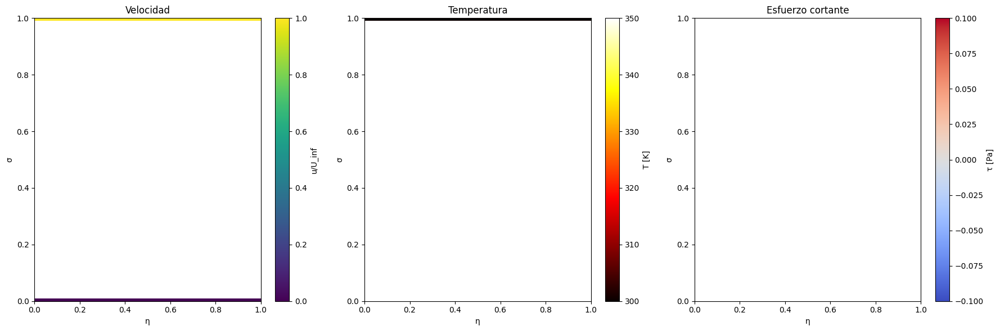

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Parámetros físicos
nu = 1.5e-5  # Viscosidad cinemática [m^2/s]
U_inf = 1.0  # Velocidad del flujo libre [m/s]
L = 1.0      # Longitud característica [m]
alpha = 2.2e-5  # Difusividad térmica [m^2/s]
T_wall = 350  # Temperatura de la pared [K]
T_inf = 300   # Temperatura del flujo libre [K]
mu = 1.8e-5   # Viscosidad dinámica [Pa·s]

# Parámetros numéricos
Ny = 100     # Número de puntos en dirección y
Nt = 200     # Número de pasos temporales (reducido para animación más fluida)
t_final = -1.0  # Tiempo final (negativo para ir hacia atrás)
y_max = 10.0  # Altura máxima del dominio

# Malla
y = np.linspace(0, y_max, Ny)
t = np.linspace(0, t_final, Nt)
eta = np.sqrt(U_inf/(nu*L)) * y
sigma = y/y_max

# Solución de Blasius (condición inicial)
def blasius_ode(eta, f):
    return [f[1], f[2], -0.5*f[0]*f[2]]

def solve_blasius():
    eta_span = (0, 10)
    y0 = [0, 0, 0.332]  # Condiciones iniciales para f, f', f''
    sol = solve_ivp(blasius_ode, eta_span, y0, dense_output=True)
    f_prime = sol.sol(eta)[1]
    return f_prime

# Inicialización con la solución de Blasius
u_blasius = U_inf * solve_blasius()
u = u_blasius.copy()
T = T_inf + (T_wall - T_inf) * (1 - u/U_inf)  # Perfil de temperatura inicial

# Función para calcular las derivadas espaciales
def spatial_derivatives(u):
    du_dy = np.gradient(u, y)
    d2u_dy2 = np.gradient(du_dy, y)
    return du_dy, d2u_dy2

# Simulación inversa en el tiempo
dt = t[1] - t[0]
u_history = [u.copy()]
T_history = [T.copy()]
tau_history = [mu * np.gradient(u, y)]

for _ in range(1, Nt):
    du_dy, d2u_dy2 = spatial_derivatives(u)
    
    # Ecuación de capa límite inversa en el tiempo
    du_dt = -u * du_dy + nu * d2u_dy2
    dT_dt = -u * np.gradient(T, y) + alpha * np.gradient(np.gradient(T, y), y)
    
    # Actualización de u y T (hacia atrás en el tiempo)
    u = u - du_dt * dt
    T = T - dT_dt * dt
    
    # Condiciones de contorno
    u[0], u[-1] = 0, U_inf
    T[0], T[-1] = T_wall, T_inf
    
    u_history.append(u.copy())
    T_history.append(T.copy())
    tau_history.append(mu * np.gradient(u, y))

# Configuración de la animación
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

im1 = ax1.imshow(np.zeros((Ny, Ny)), extent=[0, 1, 0, 1], origin='lower', aspect='auto', cmap='viridis', animated=True)
im2 = ax2.imshow(np.zeros((Ny, Ny)), extent=[0, 1, 0, 1], origin='lower', aspect='auto', cmap='hot', animated=True)
im3 = ax3.imshow(np.zeros((Ny, Ny)), extent=[0, 1, 0, 1], origin='lower', aspect='auto', cmap='coolwarm', animated=True)

ax1.set_title('Velocidad')
ax1.set_xlabel('η')
ax1.set_ylabel('σ')
fig.colorbar(im1, ax=ax1, label='u/U_inf')

ax2.set_title('Temperatura')
ax2.set_xlabel('η')
ax2.set_ylabel('σ')
fig.colorbar(im2, ax=ax2, label='T [K]')

ax3.set_title('Esfuerzo cortante')
ax3.set_xlabel('η')
ax3.set_ylabel('σ')
fig.colorbar(im3, ax=ax3, label='τ [Pa]')

def animate(i):
    u_frame = np.outer(u_history[i]/U_inf, np.ones(Ny))
    T_frame = np.outer(T_history[i], np.ones(Ny))
    tau_frame = np.outer(tau_history[i], np.ones(Ny))
    
    im1.set_array(u_frame)
    im2.set_array(T_frame)
    im3.set_array(tau_frame)
    
    im1.set_clim(0, 1)
    im2.set_clim(T_inf, T_wall)
    im3.set_clim(0, np.max(tau_history))
    
    return im1, im2, im3

anim = FuncAnimation(fig, animate, frames=Nt, interval=50, blit=True)

plt.tight_layout()
HTML(anim.to_jshtml())
